In [2]:
# Clean up existing installations
%pip uninstall tensorflow tensorflow-intel protobuf numpy pytorch-lightning tensorboard -y

# Install base dependencies with exact versions
%pip install "protobuf==3.20.1"
%pip install "numpy==1.23.5"

# Install TensorFlow stack with pinned dependencies
%pip install "tensorflow==2.12.0" --no-deps
%pip install "tensorboard==2.12.0" --no-deps
%pip install "tensorflow-estimator==2.12.0" --no-deps

# Install PyTorch Lightning with compatible versions
%pip install "pytorch-lightning==1.6.5" "torch==1.12.0" "torchvision==0.13.0"

# Install computer vision packages
%pip install "scikit-image==0.19.3" "opencv-python==4.8.0.76"

Found existing installation: tensorflow 2.12.0Note: you may need to restart the kernel to use updated packages.

Uninstalling tensorflow-2.12.0:
  Successfully uninstalled tensorflow-2.12.0
Found existing installation: protobuf 3.20.1
Uninstalling protobuf-3.20.1:
  Successfully uninstalled protobuf-3.20.1
Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5
Found existing installation: pytorch-lightning 1.6.5
Uninstalling pytorch-lightning-1.6.5:
  Successfully uninstalled pytorch-lightning-1.6.5
Found existing installation: tensorboard 2.12.0
Uninstalling tensorboard-2.12.0:
  Successfully uninstalled tensorboard-2.12.0


You can safely remove it manually.


  Using cached protobuf-3.20.1-cp310-cp310-win_amd64.whl.metadata (698 bytes)
Using cached protobuf-3.20.1-cp310-cp310-win_amd64.whl (903 kB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached numpy-1.23.5-cp310-cp310-win_amd64.whl.metadata (2.3 kB)
Using cached numpy-1.23.5-cp310-cp310-win_amd64.whl (14.6 MB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached tensorflow-2.12.0-cp310-cp310-win_amd64.whl.metadata (2.5 kB)
Using cached tensorflow-2.12.0-cp310-cp310-win_amd64.whl (1.9 kB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached tensorboard-2.12.0-py3-none-any.whl.metadata (1.8 kB)
Using cached tensorboard-2.12.0-py3-none-any.whl (5.6 MB)
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached pytorch_lightning-1.6.5-py3-none-any.whl.metadata (32 kB)
Using cached pytorch_lightning-1.6.5-py3-none-any.whl (585 kB)
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: pytorch-lightning 1.6.5 has a non-standard dependency specifier torch>=1.8.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


DEPRECATION: pytorch-lightning 1.6.5 has a non-standard dependency specifier torch>=1.8.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pytorch-lightning or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse
import lpips

In [ ]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Add current path to workspace
sys.path.append(os.getcwd())
from led.pipelines.led_pipeline import LEDPipeline
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

# Load the original low-quality image
low_quality_image_path = 'docs/example.jpeg'
low_quality_image = cv2.imread(low_quality_image_path)[:, :, ::-1]  # BGR to RGB

# Generate the final degraded image (LED + PCENet)
led = LEDPipeline(backend='PCE-Net', num_cond_steps=200)
led_pcenet_enhancement = led(low_quality_image)[0]



100%|██████████| 50/50 [04:43<00:00,  5.68s/it]


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Projects\com3025cw\.venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
c:\Projects\com3025cw\.venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Projects\com3025cw\.venv\lib\site-packages\lpips\weights\v0.1\alex.pth
Metrics:
PSNR: 18.04 dB
SSIM: 0.8219
MSE: 0.0157
FCNR: 0.6530
LPIPS: 0.3616
Vessel Density: 0.0282
Original Vessel Density: 0.0143


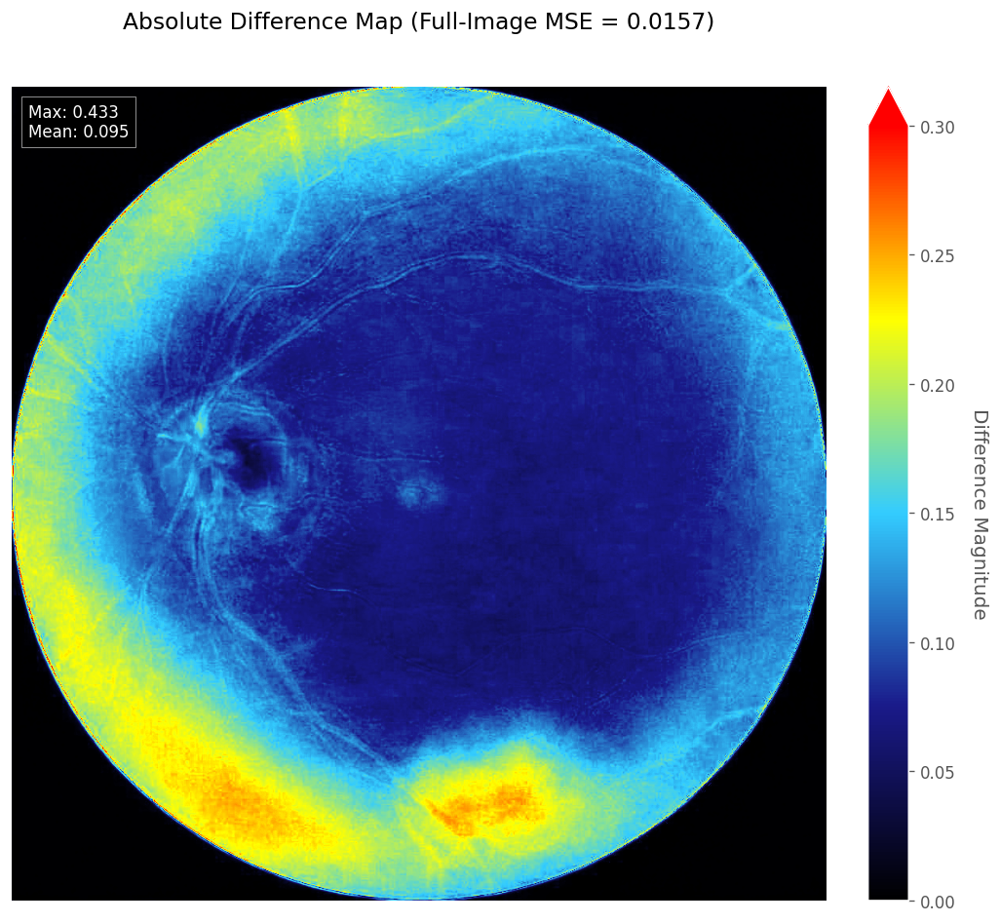

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


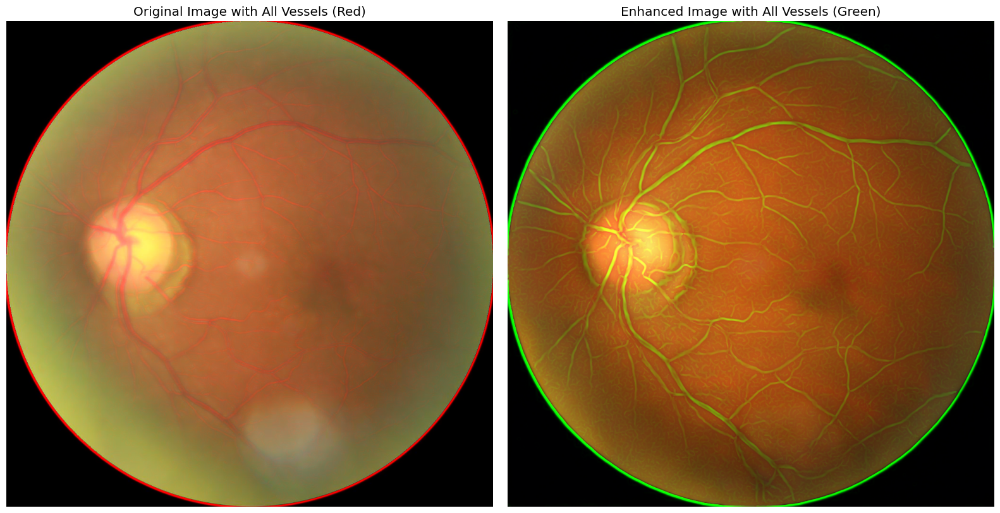

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

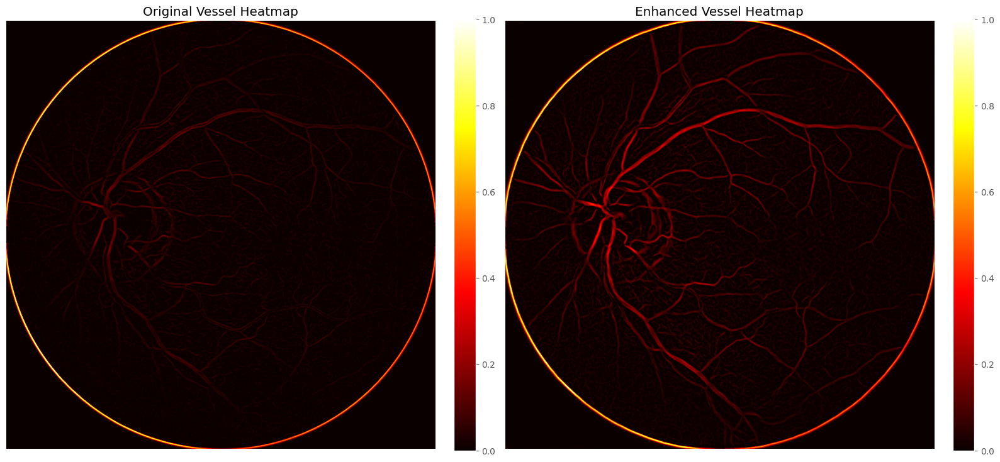

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


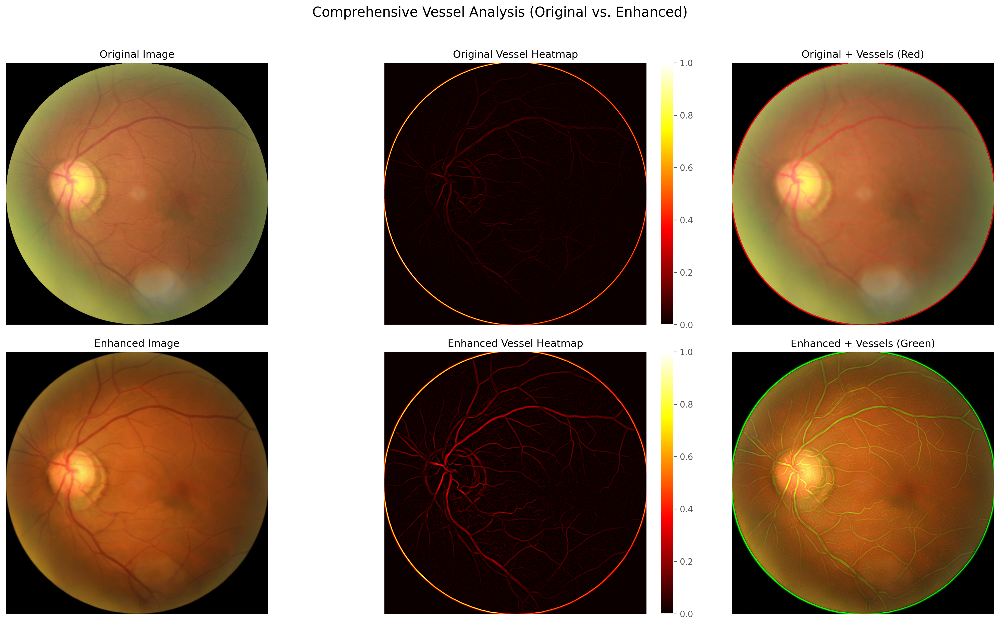

In [ ]:
import os
import cv2
import torch
import numpy as np
from pathlib import Path
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from skimage.filters import frangi, meijering
import matplotlib.pyplot as plt
import lpips

# --- Configuration ---
output_dir = Path("docs")
output_dir.mkdir(parents=True, exist_ok=True)

# --- Image Preprocessing ---
def preprocess_image(img):
    if len(img.shape) == 3 and img.shape[2] == 3:
        processed = img.copy()
    else:
        processed = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return (processed.astype(np.float32) / 255.0).clip(0, 1)

original_img = preprocess_image(low_quality_image)
enhanced_img = preprocess_image(led_pcenet_enhancement)

if original_img.shape != enhanced_img.shape:
    enhanced_img = cv2.resize(enhanced_img, (original_img.shape[1], original_img.shape[0]))

# --- Enhanced Vessel Detection ---
def enhanced_vessel_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    vessels_frangi = frangi(gray, sigmas=range(1, 5), black_ridges=False)
    vessels_meijer = meijering(gray, sigmas=range(1, 3), mode='reflect')
    combined = 0.7 * vessels_frangi + 0.3 * vessels_meijer
    combined = (combined - combined.min()) / (combined.max() - combined.min() + 1e-8)
    mask = (combined > (0.15 + 0.1 * np.mean(combined))).astype(np.float32)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((3,3), dtype=np.float32))
    return mask, combined

# Run vessel detection
orig_mask, orig_vis = enhanced_vessel_detection(original_img)
enh_mask, enh_vis = enhanced_vessel_detection(enhanced_img)

# --- Calculate Metrics ---
def calculate_metrics(original, enhanced):
    metrics = {}
    metrics['psnr'] = psnr(original, enhanced, data_range=1.0)
    metrics['ssim'] = ssim(original, enhanced, channel_axis=2, data_range=1.0)
    metrics['mse'] = np.mean((original - enhanced) ** 2)
    
    gray_enhanced = cv2.cvtColor(enhanced, cv2.COLOR_RGB2GRAY)
    roi = cv2.dilate(enh_mask, np.ones((9,9)))
    bg_pixels = gray_enhanced[(roi > 0) & (enh_mask == 0)]
    vessel_pixels = gray_enhanced[enh_mask > 0]
    metrics['fcnr'] = abs(bg_pixels.mean() - vessel_pixels.mean()) / (gray_enhanced[roi > 0].std() + 1e-6)
    metrics['vessel_density'] = enh_mask.mean()
    metrics['orig_density'] = orig_mask.mean()
    
    try:
        loss_fn = lpips.LPIPS(net='alex').eval()
        img1 = lpips.im2tensor(original * 255)
        img2 = lpips.im2tensor(enhanced * 255)
        if torch.cuda.is_available():
            img1, img2 = img1.cuda(), img2.cuda()
            loss_fn = loss_fn.cuda()
        with torch.no_grad():
            metrics['lpips'] = loss_fn(img1, img2).item()
    except:
        metrics['lpips'] = 0.0  # Fallback value
    
    return metrics

metrics = calculate_metrics(original_img, enhanced_img)

print("Metrics:")
print(f"PSNR: {metrics['psnr']:.2f} dB")
print(f"SSIM: {metrics['ssim']:.4f}")
print(f"MSE: {metrics['mse']:.4f}")
print(f"FCNR: {metrics['fcnr']:.4f}")
print(f"LPIPS: {metrics['lpips']:.4f}")
print(f"Vessel Density: {metrics['vessel_density']:.4f}")
print(f"Original Vessel Density: {metrics['orig_density']:.4f}")

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# --- Calculate Full-Image Differences ---
mse = np.mean((original_img - enhanced_img) ** 2)  # Full-image MSE
abs_diff = np.abs(enhanced_img - original_img).mean(axis=2)  # Grayscale difference

# --- Create Optimized Colormap ---
diff_cmap = LinearSegmentedColormap.from_list(
    'diff_cmap', 
    ['#000000', '#1a1a8a', '#33ccff', '#ffff00', '#ff0000']  # Black → Blue → Cyan → Yellow → Red
)

# --- Create Figure ---
plt.figure(figsize=(10, 8), dpi=120)

# Plot Difference Map
im = plt.imshow(
    abs_diff,
    cmap=diff_cmap,
    vmin=0,
    vmax=0.3  # Adjust based on your data range
)

# Add Colorbar with Clear Label
cbar = plt.colorbar(
    im,
    fraction=0.046,
    pad=0.04,
    extend='max'  # Shows if values exceed vmax
)
cbar.set_label('Difference Magnitude', rotation=270, labelpad=20)

# Title with MSE
plt.title(
    f"Absolute Difference Map (Full-Image MSE = {mse:.4f})\n",
    fontsize=14,
    pad=20
)

# Annotate Key Metrics
plt.text(
    0.02, 0.98,
    f"Max: {abs_diff.max():.3f}\nMean: {abs_diff.mean():.3f}",
    transform=plt.gca().transAxes,
    color='white',
    fontsize=10,
    verticalalignment='top',
    bbox=dict(facecolor='black', alpha=0.7)
)

plt.axis('off')
plt.tight_layout()
plt.show()



# --- Create Individual Vessel Visualizations ---
plt.figure(figsize=(16, 8))


# --- Brighter Vessel Overlay Function ---
def create_brighter_vessel_overlay(image, vessel_map, color, intensity=1.0, brightness_boost=2):
    """
    Enhanced version with brighter vessels.
    
    Parameters:
    - image: Base image (RGB, float32, [0,1])
    - vessel_map: Vessel probability map
    - color: 'red' or 'green'
    - intensity: Overlay strength (0.0-1.0)
    - brightness_boost: Multiplier for vessel brightness (>1.0 = brighter)
    """
    # Normalize and scale vessel map for better visibility
    norm_map = (vessel_map - vessel_map.min()) / (vessel_map.max() - vessel_map.min() + 1e-8)
    norm_map = np.clip(norm_map * brightness_boost, 0, 1)  # Boost brightness
    
    # Create colored mask
    if color.lower() == 'red':
        color_mask = np.stack([norm_map, np.zeros_like(norm_map), np.zeros_like(norm_map)], axis=-1)
    elif color.lower() == 'green':
        color_mask = np.stack([np.zeros_like(norm_map), norm_map, np.zeros_like(norm_map)], axis=-1)
    else:
        raise ValueError("Color must be 'red' or 'green'")
    
    # Blend with original image
    return cv2.addWeighted(image, 1.0, color_mask, intensity, 0)

# Original image with ALL red vessels from vessel map
plt.subplot(1, 2, 1)
original_with_vessels = create_brighter_vessel_overlay(original_img, orig_vis, 'red', intensity=1.0)
plt.imshow(original_with_vessels)
plt.title("Original Image with All Vessels (Red)")
plt.axis('off')

# Enhanced image with ALL green vessels from vessel map
plt.subplot(1, 2, 2)
enhanced_with_vessels = create_brighter_vessel_overlay(enhanced_img, enh_vis, 'green', intensity=1.0)
plt.imshow(enhanced_with_vessels)
plt.title("Enhanced Image with All Vessels (Green)")
plt.axis('off')

plt.tight_layout()
plt.show()  # Show instead of saving

# --- Create Combined Visualization showing ALL vessels ---
plt.figure(figsize=(12, 8))

# Add legend
from matplotlib.patches import Patch


# --- Alternative Combined Visualization ---
plt.figure(figsize=(12, 8))

# Start with a darker version of the enhanced image for better contrast
darkened_img = enhanced_img * 0.7

# Create combined mask showing both vessel systems
# Scale for better visualization
red_map = orig_vis * 1.2
green_map = enh_vis * 1.2

# Clip to valid range
red_map = np.clip(red_map, 0, 1)
green_map = np.clip(green_map, 0, 1)

# --- Create Heatmap Visualizations ---
plt.figure(figsize=(16, 8))

# Original vessel map as heatmap
plt.subplot(1, 2, 1)
plt.imshow(orig_vis, cmap='hot')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Original Vessel Heatmap")
plt.axis('off')

# Enhanced vessel map as heatmap
plt.subplot(1, 2, 2)
plt.imshow(enh_vis, cmap='hot')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Enhanced Vessel Heatmap")
plt.axis('off')

plt.tight_layout()
plt.show()  # Show instead of saving

# --- Create Comprehensive Figure (2 Rows) ---
fig, axes = plt.subplots(2, 3, figsize=(18, 10), dpi=300)
fig.suptitle("Comprehensive Vessel Analysis (Original vs. Enhanced)", fontsize=16, y=1.02)

# === Row 1: Original Image ===
# Original Image
axes[0, 0].imshow(original_img)
axes[0, 0].set_title("Original Image", fontsize=12)
axes[0, 0].axis('off')

# Original Vessel Heatmap
hm1 = axes[0, 1].imshow(orig_vis, cmap='hot')
axes[0, 1].set_title("Original Vessel Heatmap", fontsize=12)
axes[0, 1].axis('off')
fig.colorbar(hm1, ax=axes[0, 1], fraction=0.046, pad=0.04)

# Original Image + Vessels (Red)
original_with_vessels = create_brighter_vessel_overlay(original_img, orig_vis, 'red', intensity=1.0, brightness_boost=1.8)
axes[0, 2].imshow(original_with_vessels)
axes[0, 2].set_title("Original + Vessels (Red)", fontsize=12)
axes[0, 2].axis('off')

# === Row 2: Enhanced Image ===
# Enhanced Image
axes[1, 0].imshow(enhanced_img)
axes[1, 0].set_title("Enhanced Image", fontsize=12)
axes[1, 0].axis('off')

# Enhanced Vessel Heatmap
hm2 = axes[1, 1].imshow(enh_vis, cmap='hot')
axes[1, 1].set_title("Enhanced Vessel Heatmap", fontsize=12)
axes[1, 1].axis('off')
fig.colorbar(hm2, ax=axes[1, 1], fraction=0.046, pad=0.04)

# Enhanced Image + Vessels (Green)
enhanced_with_vessels = create_brighter_vessel_overlay(enhanced_img, enh_vis, 'green', intensity=1.0, brightness_boost=1.8)
axes[1, 2].imshow(enhanced_with_vessels)
axes[1, 2].set_title("Enhanced + Vessels (Green)", fontsize=12)
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Projects\com3025cw\.venv\lib\site-packages\lpips\weights\v0.1\alex.pth
Metrics:
PSNR: 18.03 dB
SSIM: 0.8224
MSE: 0.0157
FCNR: 0.6532
LPIPS: 0.3643
Vessel Density: 0.0284
Original Vessel Density: 0.0143


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Figure 1 saved: Absolute Difference Map


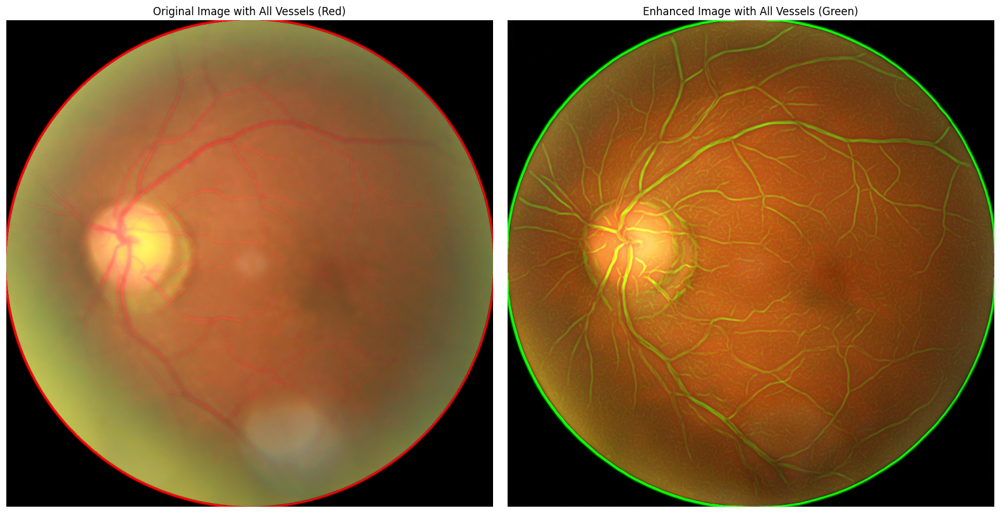

Figure 2 saved: Vessel Overlay Comparison


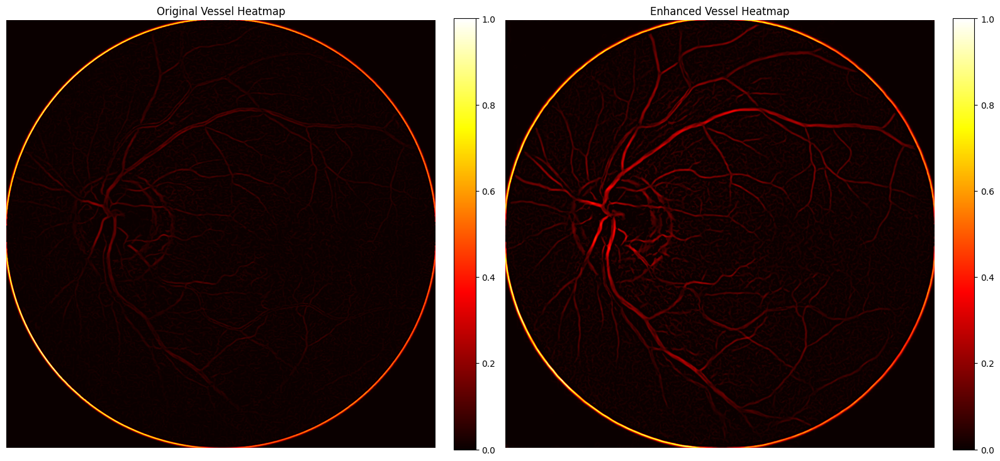

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Figure 3 saved: Vessel Heatmap Comparison
Figure 4 saved: Comprehensive Vessel Analysis
Metrics report saved to docs/metrics_report.txt
All analysis complete. Results saved to 'docs' folder.


In [11]:
import os
import cv2
import torch
import numpy as np
from pathlib import Path
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from skimage.filters import frangi, meijering
import matplotlib.pyplot as plt
import lpips
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

# =====================================================================
# Configuration and Setup
# =====================================================================
output_dir = Path("docs")
output_dir.mkdir(parents=True, exist_ok=True)

# =====================================================================
# Image Preprocessing Functions
# =====================================================================
def preprocess_image(img):
    """
    Convert image to RGB and normalize to [0,1] range
    """
    if len(img.shape) == 3 and img.shape[2] == 3:
        processed = img.copy()
    else:
        processed = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return (processed.astype(np.float32) / 255.0).clip(0, 1)

# Process input images
original_img = preprocess_image(low_quality_image)
enhanced_img = preprocess_image(led_pcenet_enhancement)

# Ensure images have the same dimensions
if original_img.shape != enhanced_img.shape:
    enhanced_img = cv2.resize(enhanced_img, (original_img.shape[1], original_img.shape[0]))

# =====================================================================
# Vessel Detection
# =====================================================================
def enhanced_vessel_detection(image):
    """
    Detect blood vessels using a combination of Frangi and Meijering filters
    
    Returns:
        mask: Binary vessel mask
        combined: Continuous vessel probability map
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    
    # Apply vessel enhancement filters
    vessels_frangi = frangi(gray, sigmas=range(1, 5), black_ridges=False)
    vessels_meijer = meijering(gray, sigmas=range(1, 3), mode='reflect')
    
    # Combine filter results
    combined = 0.7 * vessels_frangi + 0.3 * vessels_meijer
    combined = (combined - combined.min()) / (combined.max() - combined.min() + 1e-8)
    
    # Create binary mask with adaptive threshold
    mask = (combined > (0.15 + 0.1 * np.mean(combined))).astype(np.float32)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((3,3), dtype=np.float32))
    
    return mask, combined

# Run vessel detection on both images
orig_mask, orig_vis = enhanced_vessel_detection(original_img)
enh_mask, enh_vis = enhanced_vessel_detection(enhanced_img)

# =====================================================================
# Metric Calculation
# =====================================================================
def calculate_metrics(original, enhanced):
    """
    Calculate various image quality and vessel metrics
    """
    metrics = {}
    
    # Standard image quality metrics
    metrics['psnr'] = psnr(original, enhanced, data_range=1.0)
    metrics['ssim'] = ssim(original, enhanced, channel_axis=2, data_range=1.0)
    metrics['mse'] = np.mean((original - enhanced) ** 2)
    
    # Vessel-specific metrics
    gray_enhanced = cv2.cvtColor(enhanced, cv2.COLOR_RGB2GRAY)
    roi = cv2.dilate(enh_mask, np.ones((9,9)))
    bg_pixels = gray_enhanced[(roi > 0) & (enh_mask == 0)]
    vessel_pixels = gray_enhanced[enh_mask > 0]
    
    # Feature Contrast-to-Noise Ratio
    metrics['fcnr'] = abs(bg_pixels.mean() - vessel_pixels.mean()) / (gray_enhanced[roi > 0].std() + 1e-6)
    
    # Vessel density metrics
    metrics['vessel_density'] = enh_mask.mean()
    metrics['orig_density'] = orig_mask.mean()
    
    # Perceptual similarity (LPIPS)
    try:
        loss_fn = lpips.LPIPS(net='alex').eval()
        img1 = lpips.im2tensor(original * 255)
        img2 = lpips.im2tensor(enhanced * 255)
        if torch.cuda.is_available():
            img1, img2 = img1.cuda(), img2.cuda()
            loss_fn = loss_fn.cuda()
        with torch.no_grad():
            metrics['lpips'] = loss_fn(img1, img2).item()
    except:
        metrics['lpips'] = 0.0  # Fallback value
    
    return metrics

# Calculate metrics comparing original and enhanced images
metrics = calculate_metrics(original_img, enhanced_img)

# Print metrics to console
print("Metrics:")
print(f"PSNR: {metrics['psnr']:.2f} dB")
print(f"SSIM: {metrics['ssim']:.4f}")
print(f"MSE: {metrics['mse']:.4f}")
print(f"FCNR: {metrics['fcnr']:.4f}")
print(f"LPIPS: {metrics['lpips']:.4f}")
print(f"Vessel Density: {metrics['vessel_density']:.4f}")
print(f"Original Vessel Density: {metrics['orig_density']:.4f}")

# =====================================================================
# Visualization Helper Functions
# =====================================================================
def create_brighter_vessel_overlay(image, vessel_map, color, intensity=1.0, brightness_boost=2):
    """
    Create image with colored vessel overlay
    
    Parameters:
    - image: Base image (RGB, float32, [0,1])
    - vessel_map: Vessel probability map
    - color: 'red' or 'green'
    - intensity: Overlay strength (0.0-1.0)
    - brightness_boost: Multiplier for vessel brightness (>1.0 = brighter)
    
    Returns:
        Image with colored vessel overlay
    """
    # Normalize and scale vessel map for better visibility
    norm_map = (vessel_map - vessel_map.min()) / (vessel_map.max() - vessel_map.min() + 1e-8)
    norm_map = np.clip(norm_map * brightness_boost, 0, 1)  # Boost brightness
    
    # Create colored mask
    if color.lower() == 'red':
        color_mask = np.stack([norm_map, np.zeros_like(norm_map), np.zeros_like(norm_map)], axis=-1)
    elif color.lower() == 'green':
        color_mask = np.stack([np.zeros_like(norm_map), norm_map, np.zeros_like(norm_map)], axis=-1)
    else:
        raise ValueError("Color must be 'red' or 'green'")
    
    # Blend with original image
    return cv2.addWeighted(image, 1.0, color_mask, intensity, 0)

# =====================================================================
# Figure 1: Absolute Difference Map
# =====================================================================
def create_difference_map():
    """
    Create and save a visualization of the differences between original and enhanced images
    """
    # Calculate full-image differences
    mse = np.mean((original_img - enhanced_img) ** 2)  # Full-image MSE
    abs_diff = np.abs(enhanced_img - original_img).mean(axis=2)  # Grayscale difference
    
    # Create optimized colormap
    diff_cmap = LinearSegmentedColormap.from_list(
        'diff_cmap', 
        ['#000000', '#1a1a8a', '#33ccff', '#ffff00', '#ff0000']  # Black → Blue → Cyan → Yellow → Red
    )

    # Create figure
    plt.figure(figsize=(10, 8), dpi=120)
    
    # Plot difference map
    im = plt.imshow(
        abs_diff,
        cmap=diff_cmap,
        vmin=0,
        vmax=0.3  # Adjust based on your data range
    )
    
    # Add colorbar with clear label
    cbar = plt.colorbar(
        im,
        fraction=0.046,
        pad=0.04,
        extend='max'  # Shows if values exceed vmax
    )
    cbar.set_label('Difference Magnitude', rotation=270, labelpad=20)
    
    # Title with MSE
    plt.title(
        f"Absolute Difference Map (Full-Image MSE = {mse:.4f})\n",
        fontsize=14,
        pad=20
    )
    
    # Annotate key metrics
    plt.text(
        0.02, 0.98,
        f"Max: {abs_diff.max():.3f}\nMean: {abs_diff.mean():.3f}",
        transform=plt.gca().transAxes,
        color='white',
        fontsize=10,
        verticalalignment='top',
        bbox=dict(facecolor='black', alpha=0.7)
    )
    
    plt.axis('off')
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig1_difference_map.png", dpi=300, bbox_inches='tight')
    plt.close()
    print("Figure 1 saved: Absolute Difference Map")

# =====================================================================
# Figure 2: Vessel Overlay Comparison
# =====================================================================
def create_vessel_overlay_comparison():
    """
    Create and save a visualization comparing vessel detection in original vs enhanced images
    """
    plt.figure(figsize=(16, 8))
    
    # Original image with red vessels
    plt.subplot(1, 2, 1)
    original_with_vessels = create_brighter_vessel_overlay(original_img, orig_vis, 'red', intensity=1.0)
    plt.imshow(original_with_vessels)
    plt.title("Original Image with All Vessels (Red)")
    plt.axis('off')
    
    # Enhanced image with green vessels
    plt.subplot(1, 2, 2)
    enhanced_with_vessels = create_brighter_vessel_overlay(enhanced_img, enh_vis, 'green', intensity=1.0)
    plt.imshow(enhanced_with_vessels)
    plt.title("Enhanced Image with All Vessels (Green)")
    plt.axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig2_vessel_overlay_comparison.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print("Figure 2 saved: Vessel Overlay Comparison")

# =====================================================================
# Figure 3: Vessel Heatmap Comparison
# =====================================================================
def create_vessel_heatmap_comparison():
    """
    Create and save heatmap visualizations of vessel detection
    """
    plt.figure(figsize=(16, 8))
    
    # Original vessel map as heatmap
    plt.subplot(1, 2, 1)
    plt.imshow(orig_vis, cmap='hot')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.title("Original Vessel Heatmap")
    plt.axis('off')
    
    # Enhanced vessel map as heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(enh_vis, cmap='hot')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.title("Enhanced Vessel Heatmap")
    plt.axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig3_vessel_heatmap.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print("Figure 3 saved: Vessel Heatmap Comparison")

# =====================================================================
# Figure 4: Comprehensive Vessel Analysis
# =====================================================================
def create_comprehensive_analysis():
    """
    Create and save a comprehensive analysis figure with multiple visualizations
    """
    fig, axes = plt.subplots(2, 3, figsize=(14, 11), dpi=300)
    fig.suptitle("Comprehensive Vessel Analysis (Original vs. Enhanced)", fontsize=16, y=1.02)
    
    # === Row 1: Original Image ===
    # Original Image
    axes[0, 0].imshow(original_img)
    axes[0, 0].set_title("Original Image", fontsize=12)
    axes[0, 0].axis('off')
    
    # Original Vessel Heatmap
    hm1 = axes[0, 1].imshow(orig_vis, cmap='hot')
    axes[0, 1].set_title("Original Vessel Heatmap", fontsize=12)
    axes[0, 1].axis('off')
    
    # Original Image + Vessels (Red)
    original_with_vessels = create_brighter_vessel_overlay(original_img, orig_vis, 'red', intensity=1.0, brightness_boost=1.8)
    axes[0, 2].imshow(original_with_vessels)
    axes[0, 2].set_title("Original + Vessels (Red)", fontsize=12)
    axes[0, 2].axis('off')
    
    # === Row 2: Enhanced Image ===
    # Enhanced Image
    axes[1, 0].imshow(enhanced_img)
    axes[1, 0].set_title("Enhanced Image", fontsize=12)
    axes[1, 0].axis('off')
    
    # Enhanced Vessel Heatmap
    hm2 = axes[1, 1].imshow(enh_vis, cmap='hot')
    axes[1, 1].set_title("Enhanced Vessel Heatmap", fontsize=12)
    axes[1, 1].axis('off')
    
    # Enhanced Image + Vessels (Green)
    enhanced_with_vessels = create_brighter_vessel_overlay(enhanced_img, enh_vis, 'green', intensity=1.0, brightness_boost=1.8)
    axes[1, 2].imshow(enhanced_with_vessels)
    axes[1, 2].set_title("Enhanced + Vessels (Green)", fontsize=12)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig4_comprehensive_analysis.png", dpi=300, bbox_inches='tight')
    plt.close()
    print("Figure 4 saved: Comprehensive Vessel Analysis")

# =====================================================================
# Generate metrics report
# =====================================================================
def generate_metrics_report():
    """
    Generate and save a text report with all metrics
    """
    with open(output_dir / "metrics_report.txt", "w") as f:
        f.write("RETINAL IMAGE ENHANCEMENT ANALYSIS METRICS\n")
        f.write("=======================================\n\n")
        f.write(f"PSNR: {metrics['psnr']:.2f} dB\n")
        f.write(f"SSIM: {metrics['ssim']:.4f}\n")
        f.write(f"MSE: {metrics['mse']:.4f}\n")
        f.write(f"FCNR: {metrics['fcnr']:.4f}\n")
        f.write(f"LPIPS: {metrics['lpips']:.4f}\n")
        f.write(f"Enhanced Vessel Density: {metrics['vessel_density']:.4f}\n")
        f.write(f"Original Vessel Density: {metrics['orig_density']:.4f}\n")
        f.write(f"Vessel Density Increase: {(metrics['vessel_density'] - metrics['orig_density'])/metrics['orig_density']*100:.2f}%\n")
    
    print("Metrics report saved to docs/metrics_report.txt")

# =====================================================================
# Main execution
# =====================================================================
if __name__ == "__main__":
    # Generate all visualizations and save to output directory
    create_difference_map()
    create_vessel_overlay_comparison()
    create_vessel_heatmap_comparison()
    create_comprehensive_analysis()
    generate_metrics_report()
    
    print("All analysis complete. Results saved to 'docs' folder.")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Projects\com3025cw\.venv\lib\site-packages\lpips\weights\v0.1\alex.pth
Metrics:
PSNR: 20.93 dB
SSIM: 0.6305
MSE: 0.0081
FCNR: 0.6398
LPIPS: 0.3851
Good Vessel Density: 0.0646
Degraded Vessel Density: 0.0630
Figure 0 saved: Side-by-Side Comparison


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Figure 1 saved: Absolute Difference Map


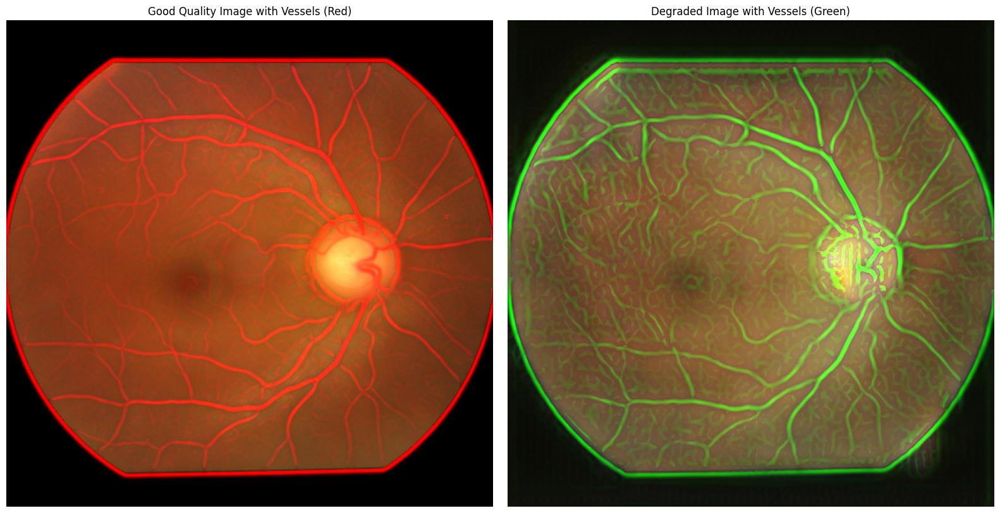

Figure 2 saved: Vessel Overlay Comparison


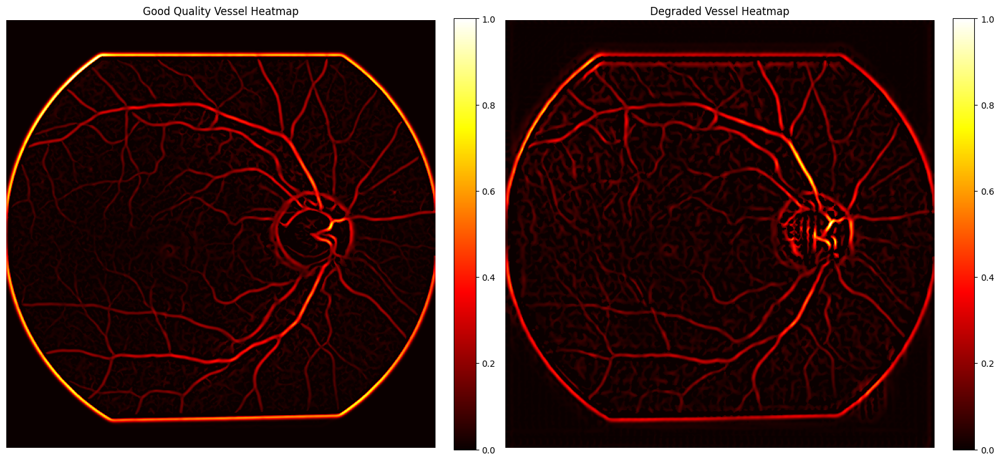

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Figure 3 saved: Vessel Heatmap Comparison
Figure 4 saved: Comprehensive Vessel Analysis
Metrics report saved to docs/metrics_report.txt
All analysis complete. Results saved to 'docs' folder.


In [13]:
import os
import cv2
import torch
import numpy as np
from pathlib import Path
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from skimage.filters import frangi, meijering
import matplotlib.pyplot as plt
import lpips
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

# =====================================================================
# Image Loading (Old Method Style)
# =====================================================================
output_dir = Path("docs")
output_dir.mkdir(parents=True, exist_ok=True)

# Define paths (using new path structure)
BASE_DIR = Path.cwd().parent
IMAGE_DIR = BASE_DIR / "finetune_images"
GOOD_IMAGE_PATH = IMAGE_DIR / "good_images/BEH-175.png"
DEGRADED_IMAGE_PATH = IMAGE_DIR / "degraded_images/0_BEH-175.png"

# Load images using old method
def load_image_old_style(path):
    """Load image using original method's approach"""
    if not Path(path).exists():
        raise FileNotFoundError(f"Image not found at: {path}")
    img = cv2.imread(str(path))[:, :, ::-1]  # BGR to RGB via slicing
    if img is None:
        raise ValueError(f"Failed to load image at: {path}")
    return img

# Load and process images
try:
    good_img = load_image_old_style(GOOD_IMAGE_PATH)
    degraded_img = load_image_old_style(DEGRADED_IMAGE_PATH)
    
    # Old normalization approach
    good_img = (good_img.astype(np.float32) / 255.0).clip(0, 1)
    degraded_img = (degraded_img.astype(np.float32) / 255.0).clip(0, 1)
    
except Exception as e:
    print(f"Error loading images: {e}")
    print(f"Looking for images in: {IMAGE_DIR}")
    exit(1)

# Old-style resizing (resize degraded to match good)
if good_img.shape != degraded_img.shape:
    degraded_img = cv2.resize(degraded_img, (good_img.shape[1], good_img.shape[0]))


# =====================================================================
# Vessel Detection
# =====================================================================
def enhanced_vessel_detection(image):
    """
    Detect blood vessels using a combination of Frangi and Meijering filters
    
    Returns:
        mask: Binary vessel mask
        combined: Continuous vessel probability map
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image
    
    # Apply vessel enhancement filters
    vessels_frangi = frangi(gray, sigmas=range(1, 5), black_ridges=False)
    vessels_meijer = meijering(gray, sigmas=range(1, 3), mode='reflect')
    
    # Combine filter results
    combined = 0.7 * vessels_frangi + 0.3 * vessels_meijer
    combined = (combined - combined.min()) / (combined.max() - combined.min() + 1e-8)
    
    # Create binary mask with adaptive threshold
    mask = (combined > (0.15 + 0.1 * np.mean(combined))).astype(np.float32)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((3,3), dtype=np.float32))
    
    return mask, combined

# Run vessel detection on both images
good_mask, good_vis = enhanced_vessel_detection(good_img)
degraded_mask, degraded_vis = enhanced_vessel_detection(degraded_img)

# =====================================================================
# Metric Calculation
# =====================================================================
def calculate_metrics(reference, degraded):
    """
    Calculate various image quality and vessel metrics
    """
    metrics = {}
    
    # Standard image quality metrics
    metrics['psnr'] = psnr(reference, degraded, data_range=1.0)
    metrics['ssim'] = ssim(reference, degraded, channel_axis=2, data_range=1.0)
    metrics['mse'] = np.mean((reference - degraded) ** 2)
    
    # Vessel-specific metrics
    gray_degraded = cv2.cvtColor(degraded, cv2.COLOR_RGB2GRAY)
    roi = cv2.dilate(good_mask, np.ones((9,9)))
    bg_pixels = gray_degraded[(roi > 0) & (good_mask == 0)]
    vessel_pixels = gray_degraded[good_mask > 0]
    
    # Feature Contrast-to-Noise Ratio
    metrics['fcnr'] = abs(bg_pixels.mean() - vessel_pixels.mean()) / (gray_degraded[roi > 0].std() + 1e-6)
    
    # Vessel density metrics
    metrics['good_vessel_density'] = good_mask.mean()
    metrics['degraded_vessel_density'] = degraded_mask.mean()
    
    # Perceptual similarity (LPIPS)
    try:
        loss_fn = lpips.LPIPS(net='alex').eval()
        img1 = lpips.im2tensor(reference * 255)
        img2 = lpips.im2tensor(degraded * 255)
        if torch.cuda.is_available():
            img1, img2 = img1.cuda(), img2.cuda()
            loss_fn = loss_fn.cuda()
        with torch.no_grad():
            metrics['lpips'] = loss_fn(img1, img2).item()
    except:
        metrics['lpips'] = 0.0  # Fallback value
    
    return metrics

# Calculate metrics comparing good and degraded images
metrics = calculate_metrics(good_img, degraded_img)

# Print metrics to console
print("Metrics:")
print(f"PSNR: {metrics['psnr']:.2f} dB")
print(f"SSIM: {metrics['ssim']:.4f}")
print(f"MSE: {metrics['mse']:.4f}")
print(f"FCNR: {metrics['fcnr']:.4f}")
print(f"LPIPS: {metrics['lpips']:.4f}")
print(f"Good Vessel Density: {metrics['good_vessel_density']:.4f}")
print(f"Degraded Vessel Density: {metrics['degraded_vessel_density']:.4f}")

# =====================================================================
# Visualization Helper Functions
# =====================================================================
def create_brighter_vessel_overlay(image, vessel_map, color, intensity=1.0, brightness_boost=2):
    """
    Create image with colored vessel overlay
    
    Parameters:
    - image: Base image (RGB, float32, [0,1])
    - vessel_map: Vessel probability map
    - color: 'red' or 'green'
    - intensity: Overlay strength (0.0-1.0)
    - brightness_boost: Multiplier for vessel brightness (>1.0 = brighter)
    
    Returns:
        Image with colored vessel overlay
    """
    # Normalize and scale vessel map for better visibility
    norm_map = (vessel_map - vessel_map.min()) / (vessel_map.max() - vessel_map.min() + 1e-8)
    norm_map = np.clip(norm_map * brightness_boost, 0, 1)  # Boost brightness
    
    # Create colored mask
    if color.lower() == 'red':
        color_mask = np.stack([norm_map, np.zeros_like(norm_map), np.zeros_like(norm_map)], axis=-1)
    elif color.lower() == 'green':
        color_mask = np.stack([np.zeros_like(norm_map), norm_map, np.zeros_like(norm_map)], axis=-1)
    else:
        raise ValueError("Color must be 'red' or 'green'")
    
    # Blend with original image
    return cv2.addWeighted(image, 1.0, color_mask, intensity, 0)


# [Previous imports and configuration remain the same until main execution]

# =====================================================================
# Figure 0: Simple Side-by-Side Comparison
# =====================================================================
def create_side_by_side_comparison():
    """
    Create and save a simple side-by-side comparison of good vs degraded images
    """
    plt.figure(figsize=(16, 8))
    
    # Good quality image
    plt.subplot(1, 2, 1)
    plt.imshow(good_img)
    plt.title("Good Quality Image", fontsize=14)
    plt.axis('off')
    
    # Degraded image
    plt.subplot(1, 2, 2)
    plt.imshow(degraded_img)
    plt.title("Degraded Image", fontsize=14)
    plt.axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig9_side_by_side.png", dpi=300, bbox_inches='tight')
    plt.close()
    print("Figure 0 saved: Side-by-Side Comparison")

# =====================================================================
# Figure 1: Absolute Difference Map
# =====================================================================
def create_difference_map():
    """
    Create and save a visualization of the differences between good and degraded images
    """
    # Calculate full-image differences
    mse = np.mean((good_img - degraded_img) ** 2)  # Full-image MSE
    abs_diff = np.abs(degraded_img - good_img).mean(axis=2)  # Grayscale difference
    
    # Create optimized colormap
    diff_cmap = LinearSegmentedColormap.from_list(
        'diff_cmap', 
        ['#000000', '#1a1a8a', '#33ccff', '#ffff00', '#ff0000']  # Black → Blue → Cyan → Yellow → Red
    )

    # Create figure
    plt.figure(figsize=(10, 8), dpi=120)
    
    # Plot difference map
    im = plt.imshow(
        abs_diff,
        cmap=diff_cmap,
        vmin=0,
        vmax=0.3  # Adjust based on your data range
    )
    
    # Add colorbar with clear label
    cbar = plt.colorbar(
        im,
        fraction=0.046,
        pad=0.04,
        extend='max'  # Shows if values exceed vmax
    )
    cbar.set_label('Difference Magnitude', rotation=270, labelpad=20)
    
    # Title with MSE
    plt.title(
        f"Absolute Difference Map (Full-Image MSE = {mse:.4f})\n",
        fontsize=14,
        pad=20
    )
    
    # Annotate key metrics
    plt.text(
        0.02, 0.98,
        f"Max: {abs_diff.max():.3f}\nMean: {abs_diff.mean():.3f}",
        transform=plt.gca().transAxes,
        color='white',
        fontsize=10,
        verticalalignment='top',
        bbox=dict(facecolor='black', alpha=0.7)
    )
    
    plt.axis('off')
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig5_difference_map.png", dpi=300, bbox_inches='tight')
    plt.close()
    print("Figure 1 saved: Absolute Difference Map")

# =====================================================================
# Figure 2: Vessel Overlay Comparison
# =====================================================================
def create_vessel_overlay_comparison():
    """
    Create and save a visualization comparing vessel detection in good vs degraded images
    """
    plt.figure(figsize=(16, 8))
    
    # Good image with red vessels
    plt.subplot(1, 2, 1)
    good_with_vessels = create_brighter_vessel_overlay(good_img, good_vis, 'red', intensity=1.0)
    plt.imshow(good_with_vessels)
    plt.title("Good Quality Image with Vessels (Red)")
    plt.axis('off')
    
    # Degraded image with green vessels
    plt.subplot(1, 2, 2)
    degraded_with_vessels = create_brighter_vessel_overlay(degraded_img, degraded_vis, 'green', intensity=1.0)
    plt.imshow(degraded_with_vessels)
    plt.title("Degraded Image with Vessels (Green)")
    plt.axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig6_vessel_overlay_comparison.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print("Figure 2 saved: Vessel Overlay Comparison")

# =====================================================================
# Figure 3: Vessel Heatmap Comparison
# =====================================================================
def create_vessel_heatmap_comparison():
    """
    Create and save heatmap visualizations of vessel detection
    """
    plt.figure(figsize=(16, 8))
    
    # Good vessel map as heatmap
    plt.subplot(1, 2, 1)
    plt.imshow(good_vis, cmap='hot')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.title("Good Quality Vessel Heatmap")
    plt.axis('off')
    
    # Degraded vessel map as heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(degraded_vis, cmap='hot')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.title("Degraded Vessel Heatmap")
    plt.axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig7_vessel_heatmap.png", dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print("Figure 3 saved: Vessel Heatmap Comparison")

# =====================================================================
# Figure 4: Comprehensive Vessel Analysis
# =====================================================================
def create_comprehensive_analysis():
    """
    Create and save a comprehensive analysis figure with multiple visualizations
    """
    fig, axes = plt.subplots(2, 3, figsize=(14, 11), dpi=300)
    fig.suptitle("Comprehensive Vessel Analysis (Good vs. Degraded)", fontsize=16, y=1.02)
    
    # === Row 1: Good Image ===
    # Good Image
    axes[0, 0].imshow(good_img)
    axes[0, 0].set_title("Good Quality Image", fontsize=12)
    axes[0, 0].axis('off')
    
    # Good Vessel Heatmap
    hm1 = axes[0, 1].imshow(good_vis, cmap='hot')
    axes[0, 1].set_title("Good Vessel Heatmap", fontsize=12)
    axes[0, 1].axis('off')
    
    # Good Image + Vessels (Red)
    good_with_vessels = create_brighter_vessel_overlay(good_img, good_vis, 'red', intensity=1.0, brightness_boost=1.8)
    axes[0, 2].imshow(good_with_vessels)
    axes[0, 2].set_title("Good + Vessels (Red)", fontsize=12)
    axes[0, 2].axis('off')
    
    # === Row 2: Degraded Image ===
    # Degraded Image
    axes[1, 0].imshow(degraded_img)
    axes[1, 0].set_title("Degraded Image", fontsize=12)
    axes[1, 0].axis('off')
    
    # Degraded Vessel Heatmap
    hm2 = axes[1, 1].imshow(degraded_vis, cmap='hot')
    axes[1, 1].set_title("Degraded Vessel Heatmap", fontsize=12)
    axes[1, 1].axis('off')
    
    # Degraded Image + Vessels (Green)
    degraded_with_vessels = create_brighter_vessel_overlay(degraded_img, degraded_vis, 'green', intensity=1.0, brightness_boost=1.8)
    axes[1, 2].imshow(degraded_with_vessels)
    axes[1, 2].set_title("Degraded + Vessels (Green)", fontsize=12)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    
    # Save figure
    plt.savefig(output_dir / "fig8_comprehensive_analysis.png", dpi=300, bbox_inches='tight')
    plt.close()
    print("Figure 4 saved: Comprehensive Vessel Analysis")

# =====================================================================
# Generate metrics report
# =====================================================================
def generate_metrics_report():
    """
    Generate and save a text report with all metrics
    """
    with open(output_dir / "degraded_metrics_report.txt", "w") as f:
        f.write("RETINAL IMAGE QUALITY DEGRADATION ANALYSIS METRICS\n")
        f.write("===============================================\n\n")
        f.write(f"PSNR: {metrics['psnr']:.2f} dB\n")
        f.write(f"SSIM: {metrics['ssim']:.4f}\n")
        f.write(f"MSE: {metrics['mse']:.4f}\n")
        f.write(f"FCNR: {metrics['fcnr']:.4f}\n")
        f.write(f"LPIPS: {metrics['lpips']:.4f}\n")
        f.write(f"Good Vessel Density: {metrics['good_vessel_density']:.4f}\n")
        f.write(f"Degraded Vessel Density: {metrics['degraded_vessel_density']:.4f}\n")
        f.write(f"Vessel Density Reduction: {(metrics['good_vessel_density'] - metrics['degraded_vessel_density'])/metrics['good_vessel_density']*100:.2f}%\n")
    
    print("Metrics report saved to docs/metrics_report.txt")

# =====================================================================
# Main execution
# =====================================================================
if __name__ == "__main__":
    # Generate all visualizations and save to output directory
    create_side_by_side_comparison()  # New figure added first
    create_difference_map()
    create_vessel_overlay_comparison()
    create_vessel_heatmap_comparison()
    create_comprehensive_analysis()
    generate_metrics_report()
    
    print("All analysis complete. Results saved to 'docs' folder.")